## Исследовательский анализ данных (EDA)  стоимости домов в Мумбаи


**Цель проекта:** предобработка и анализ данных для задачи классификации

In [6]:
import ml_library

ModuleNotFoundError: No module named 'ml_library'

### Инициализация проекта 

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import folium

In [3]:
data = pd.read_csv('mumbai_houses_task.csv', sep=',')

## Исследование исходных данных

**Датасет содержит следующие поля:**

- ``` price ``` - цена
- ``` area ``` - область
- ``` latitude``` - широта
- ``` longitude ``` - долгота
- ``` Bedrooms ``` - количество спален
- ``` Bathrooms ``` - количество душевых
- ``` Balcony ``` - количество балконов
- ``` Status ``` - статус постройки
- ``` neworold ``` - тип объекта недвижимости
- ``` parking ``` - количество парковочных мест
- ``` Furnished_status ``` - статус обустройства объекта (мебилировка)
- ``` Lift ``` - количество лифтов 
- ``` type_of_building ``` - тип строения (квартира/частный дом)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6255 entries, 0 to 6254
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             6255 non-null   float64
 1   area              6255 non-null   float64
 2   latitude          6255 non-null   float64
 3   longitude         6255 non-null   float64
 4   Bedrooms          6255 non-null   float64
 5   Bathrooms         6255 non-null   float64
 6   Balcony           6255 non-null   float64
 7   Status            5774 non-null   object 
 8   neworold          6255 non-null   object 
 9   parking           6255 non-null   float64
 10  Furnished_status  3600 non-null   object 
 11  Lift              6255 non-null   float64
 12  type_of_building  6255 non-null   object 
dtypes: float64(9), object(4)
memory usage: 635.4+ KB


In [5]:
data.head()

,price,area,latitude,longitude,Bedrooms,Bathrooms,Balcony,Status,neworold,parking,Furnished_status,Lift,type_of_building
0,22400000.0,629.0,19.032800,72.896357,2.0,2.0,0.0,Under Construction,New Property,0.0,NaN,0.0,Flat
1,35000000.0,974.0,19.032800,72.896357,3.0,2.0,0.0,Under Construction,New Property,0.0,NaN,0.0,Flat
2,31700000.0,968.0,19.085600,72.909277,3.0,3.0,0.0,Under Construction,New Property,0.0,NaN,0.0,Flat
3,18700000.0,629.0,19.155756,72.846862,2.0,2.0,2.0,Ready to Move,New Property,2.0,NaN,2.0,Flat
4,13500000.0,1090.0,19.177555,72.849887,2.0,2.0,0.0,NaN,New Property,0.0,Unfurnished,0.0,Flat


In [6]:
# Проверка наличия пропущенных значений
(data.isna().sum()/data.shape[0]*100).sort_values(ascending=False)                                                  

Furnished_status    42.446043
Status               7.689848
latitude             0.000000
area                 0.000000
price                0.000000
Bedrooms             0.000000
longitude            0.000000
Balcony              0.000000
Bathrooms            0.000000
neworold             0.000000
parking              0.000000
Lift                 0.000000
type_of_building     0.000000
dtype: float64

In [7]:
data.describe()

,price,area,latitude,longitude,Bedrooms,Bathrooms,Balcony,parking,Lift
count,6.255000e+03,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000,6255.000000
mean,2.684187e+07,1185.625260,19.156772,72.868642,2.452278,2.425580,0.821583,0.821583,0.821583
std,2.788831e+07,636.973259,0.109447,0.058614,0.749534,0.762604,1.291957,1.291957,1.291957
min,1.500000e+06,503.000000,18.873713,72.754080,2.000000,0.000000,0.000000,0.000000,0.000000
25%,1.300000e+07,846.500000,19.081509,72.832930,2.000000,2.000000,0.000000,0.000000,0.000000
50%,1.900000e+07,1000.000000,19.147269,72.858019,2.000000,2.000000,0.000000,0.000000,0.000000
75%,3.000000e+07,1300.000000,19.213054,72.884691,3.000000,3.000000,1.000000,1.000000,1.000000
max,3.600000e+08,8000.000000,19.476239,73.197823,10.000000,10.000000,8.000000,8.000000,8.000000


In [8]:
#Вывод уникальных значений в столбцах

print(f"Status:  {data['Status'].nunique()}")
print(f"Furnished_status: {data['Furnished_status'].nunique()}")
print (f"neworold:   {data['neworold'].nunique()}")
print(f"type_of_building:  {data['type_of_building'].nunique()}")


Status:  2
Furnished_status: 3
neworold:   2
type_of_building:  2


**Характеристика исходных данных**

- в столбцах ```Furnished_status``` и ```Status``` отсутствуют значения, причём в первом пропущно более **40%**;

- в столбцах ```Bedrooms ```, ```Bathrooms```, ```Balcony```, ```parking``` и ```Lift``` нет необходимости использовать тип данных 'float', так как признаки предполагают целочисленные значения.

- в столбцах ```Furnished_status```, ```Status```, ```neworold```, ```type_of_building``` небольшое количество уникальных значений, значит эти признаки соответствуют категориальному типу 'category'


### Обработка пропущенных значений

<font size=4>
<b>Недостающее значение данных в следующих столбцах:</b>

- ```Furnished_status```
- ```Status```</font>

<font size=4><b>Предположения для заполнения пропущенного значения:</b>


- Так как пропущенные значения в ```Furnished_status``` составляют более 40%, то заполним пропущенне поля на моду этого столбца </font>







In [9]:
def fill_category_agregat(column):
    mode_value = data[column].mode()[0]
    data[column]=data[column].fillna(mode_value)

In [10]:
furn_status = 'Furnished_status'

fill_category_agregat(furn_status)
data[furn_status].value_counts()

Furnished_status
Unfurnished       4039
Semi-Furnished    1195
Furnished         1021
Name: count, dtype: int64

- Заполним пропущенные поля Status на значение моды по этому столбцу.

In [11]:
status= 'Status'

fill_category_agregat(status)
data[status].value_counts()

Status
Ready to Move         6252
Under Construction       3
Name: count, dtype: int64

### Проверка на нулевое количество пропущенных значений


In [12]:
(data.isna().sum()/data.shape[0]*100).sort_values(ascending=False)

price               0.0
area                0.0
latitude            0.0
longitude           0.0
Bedrooms            0.0
Bathrooms           0.0
Balcony             0.0
Status              0.0
neworold            0.0
parking             0.0
Furnished_status    0.0
Lift                0.0
type_of_building    0.0
dtype: float64

### Коррекция типов данных

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6255 entries, 0 to 6254
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             6255 non-null   float64
 1   area              6255 non-null   float64
 2   latitude          6255 non-null   float64
 3   longitude         6255 non-null   float64
 4   Bedrooms          6255 non-null   float64
 5   Bathrooms         6255 non-null   float64
 6   Balcony           6255 non-null   float64
 7   Status            6255 non-null   object 
 8   neworold          6255 non-null   object 
 9   parking           6255 non-null   float64
 10  Furnished_status  6255 non-null   object 
 11  Lift              6255 non-null   float64
 12  type_of_building  6255 non-null   object 
dtypes: float64(9), object(4)
memory usage: 635.4+ KB


In [14]:
data['Bedrooms'] = data['Bedrooms'].astype('uint8')
data['Bathrooms']= data['Bathrooms'].astype('uint8')
data['Balcony']= data['Balcony'].astype('uint8')
data['parking']=data['parking'].astype('uint8')
data['Lift'] = data['Lift'].astype('uint8')
data['neworold'] = data['neworold'].astype('category')
data['Status']=data['Status'].astype('category')
data['Furnished_status'] = data['Furnished_status'].astype('category')
data['type_of_building'] = data['type_of_building'].astype('category')
data['area']=data['area'].astype('int16')

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6255 entries, 0 to 6254
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   price             6255 non-null   float64 
 1   area              6255 non-null   int16   
 2   latitude          6255 non-null   float64 
 3   longitude         6255 non-null   float64 
 4   Bedrooms          6255 non-null   uint8   
 5   Bathrooms         6255 non-null   uint8   
 6   Balcony           6255 non-null   uint8   
 7   Status            6255 non-null   category
 8   neworold          6255 non-null   category
 9   parking           6255 non-null   uint8   
 10  Furnished_status  6255 non-null   category
 11  Lift              6255 non-null   uint8   
 12  type_of_building  6255 non-null   category
dtypes: category(4), float64(3), int16(1), uint8(5)
memory usage: 214.4 KB


**Коррекция признака price**

Большинство значений в стобце price представлены в виде чисел с, как минимум, 6-ти нулями. В качестве экономии памяти, стоит изменить единицу измерения с рупий на миллион рупий, округляя некоторые значения и приводя тип данных в float32

In [15]:
data['price']

0       22400000.0
1       35000000.0
2       31700000.0
3       18700000.0
4       13500000.0
           ...    
6250    19500000.0
6251    22000000.0
6252    20000000.0
6253    11000000.0
6254    15000000.0
Name: price, Length: 6255, dtype: float64

In [16]:
data_price= data['price'].apply(round)
data_price = data_price/1e6
data['price'] = data_price
data['price']=data['price'].astype('float32')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6255 entries, 0 to 6254
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   price             6255 non-null   float32 
 1   area              6255 non-null   int16   
 2   latitude          6255 non-null   float64 
 3   longitude         6255 non-null   float64 
 4   Bedrooms          6255 non-null   uint8   
 5   Bathrooms         6255 non-null   uint8   
 6   Balcony           6255 non-null   uint8   
 7   Status            6255 non-null   category
 8   neworold          6255 non-null   category
 9   parking           6255 non-null   uint8   
 10  Furnished_status  6255 non-null   category
 11  Lift              6255 non-null   uint8   
 12  type_of_building  6255 non-null   category
dtypes: category(4), float32(1), float64(2), int16(1), uint8(5)
memory usage: 190.0 KB


### Проверка дубликатов

In [17]:
data.duplicated().sum()

np.int64(18)

In [18]:
data.drop_duplicates(inplace= True)
data.reset_index(drop=True, inplace=True)
data.duplicated().sum()

np.int64(0)

### Перевод в нижний регистр названий столбцов

In [ ]:
data.columns = data.columns.str.lower()
data



,price,area,latitude,longitude,bedrooms,bathrooms,balcony,status,neworold,parking,furnished_status,lift,type_of_building
0,22.400000,629,19.032800,72.896357,2,2,0,Under Construction,New Property,0,Unfurnished,0,Flat
1,35.000000,974,19.032800,72.896357,3,2,0,Under Construction,New Property,0,Unfurnished,0,Flat
2,31.700001,968,19.085600,72.909277,3,3,0,Under Construction,New Property,0,Unfurnished,0,Flat
3,18.700001,629,19.155756,72.846862,2,2,2,Ready to Move,New Property,2,Unfurnished,2,Flat
4,13.500000,1090,19.177555,72.849887,2,2,0,Ready to Move,New Property,0,Unfurnished,0,Flat
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6232,19.500000,810,19.138320,72.810020,2,2,0,Ready to Move,Resale,0,Semi-Furnished,0,Flat
6233,22.000000,1400,19.221920,72.854250,3,3,1,Ready to Move,Resale,1,Unfurnished,1,Flat
6234,20.000000,750,19.144320,72.824111,2,2,0,Ready to Move,Resale,0,Unfurnished,0,Flat
6235,11.000000,700,19.047201,72.872225,2,2,0,Ready to Move,Resale,0,Furnished,0,Flat


## EDA

### Исследование основных параметров

Параметры:

- Цена
- Площадь участка в кв.м
- Тип объекта недвижимости (новое, или повторно продаваемое)
- Локация
- Наличик паркинга 
- Статус обустройства мебелью
- Тип строения (квартира или частный дом)

**Построим гистограммы для некоторых параметров**

,price,area,bathrooms,balcony,lift,parking,bedrooms
count,6237.000000,6237.000000,6237.000000,6237.000000,6237.000000,6237.000000,6237.000000
mean,26.862148,1185.597723,2.425525,0.822350,0.822350,0.822350,2.452301
std,27.921251,637.515522,0.763236,1.291977,1.291977,1.291977,0.750140
min,1.500000,503.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,13.000000,846.000000,2.000000,0.000000,0.000000,0.000000,2.000000
50%,19.000000,1000.000000,2.000000,0.000000,0.000000,0.000000,2.000000
75%,30.000000,1300.000000,3.000000,1.000000,1.000000,1.000000,3.000000
max,360.000000,8000.000000,10.000000,8.000000,8.000000,8.000000,10.000000


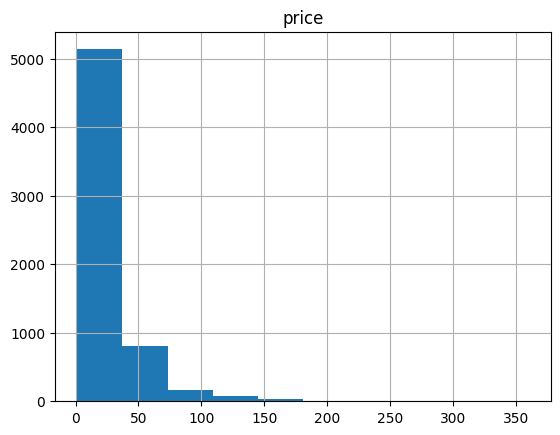

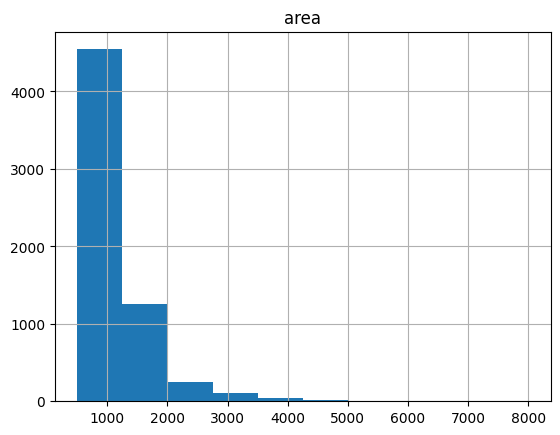

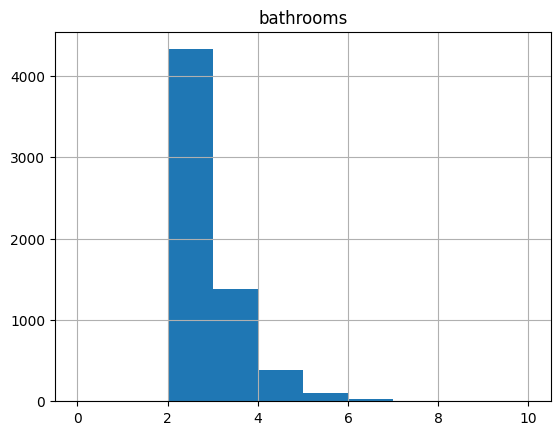

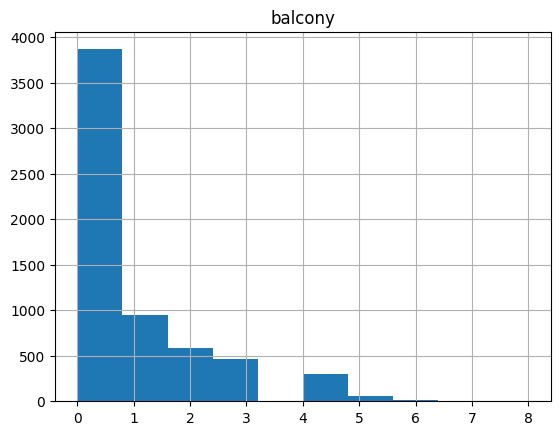

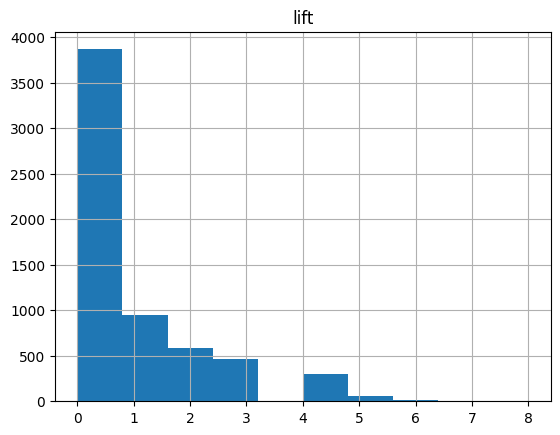

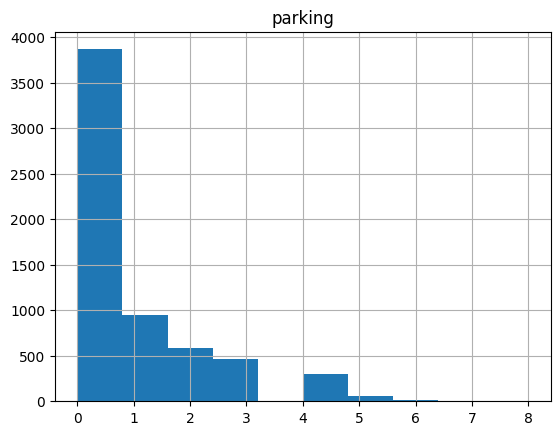

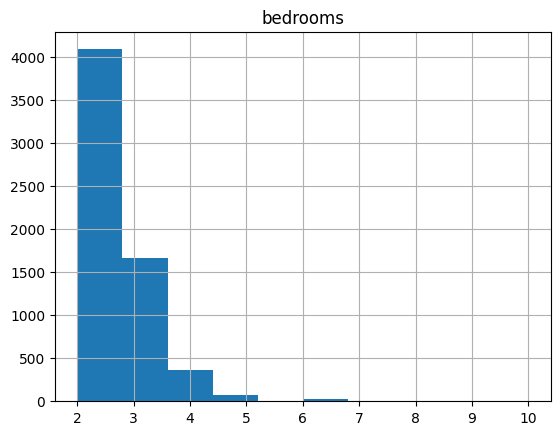

In [20]:
columns = ['price','area','bathrooms','balcony','lift', 'parking', 'bedrooms']

for column in columns:
    data.hist(column)

data.describe()[columns]

### Изучение и обработка выбросов

Так как в приведённых выше результатах все столбцы содержат выбросы, то создадим DataFrame без этих выбросов. Выбросы можно идентифицировать путем определения нижнего/верхнего предела нормального диапазона значений.

Используем метод межквартильлных размахов

In [21]:

outlier = data[columns] 

Q1 = outlier.quantile(0.25)
Q1

price         13.0
area         846.0
bathrooms      2.0
balcony        0.0
lift           0.0
parking        0.0
bedrooms       2.0
Name: 0.25, dtype: float64

In [22]:
Q3 = outlier.quantile(0.75)
Q3

price          30.0
area         1300.0
bathrooms       3.0
balcony         1.0
lift            1.0
parking         1.0
bedrooms        3.0
Name: 0.75, dtype: float64

In [23]:
# IQR-оценки
IQR = Q3-Q1
#Отфильтрованные данные,из которых удалены выбросы
data_filtered = outlier[~((outlier<(Q1-1.5*IQR)) |(outlier > (Q3+1.5*IQR)).any(axis=1))]
data_filtered




,price,area,bathrooms,balcony,lift,parking,bedrooms
0,22.400000,629,2.0,0,0,0,2
1,35.000000,974,2.0,0,0,0,3
2,31.700001,968,3.0,0,0,0,3
3,18.700001,629,2.0,2,2,2,2
4,13.500000,1090,2.0,0,0,0,2
...,...,...,...,...,...,...,...
6232,19.500000,810,2.0,0,0,0,2
6233,22.000000,1400,3.0,1,1,1,3
6234,20.000000,750,2.0,0,0,0,2
6235,11.000000,700,2.0,0,0,0,2


In [24]:
index_list = list(data_filtered.index.values)

data_filtered = data[data.index.isin(index_list)]
data_filtered.head()

,price,area,latitude,longitude,bedrooms,bathrooms,balcony,status,neworold,parking,furnished_status,lift,type_of_building
0,22.400000,629,19.032800,72.896357,2,2,0,Under Construction,New Property,0,Unfurnished,0,Flat
1,35.000000,974,19.032800,72.896357,3,2,0,Under Construction,New Property,0,Unfurnished,0,Flat
2,31.700001,968,19.085600,72.909277,3,3,0,Under Construction,New Property,0,Unfurnished,0,Flat
3,18.700001,629,19.155756,72.846862,2,2,2,Ready to Move,New Property,2,Unfurnished,2,Flat
4,13.500000,1090,19.177555,72.849887,2,2,0,Ready to Move,New Property,0,Unfurnished,0,Flat


In [25]:
filtered_outlier = data_filtered[columns]

Сравним полученные данные после обработки выбросов

array([[<Axes: title={'center': 'price'}>]], dtype=object)

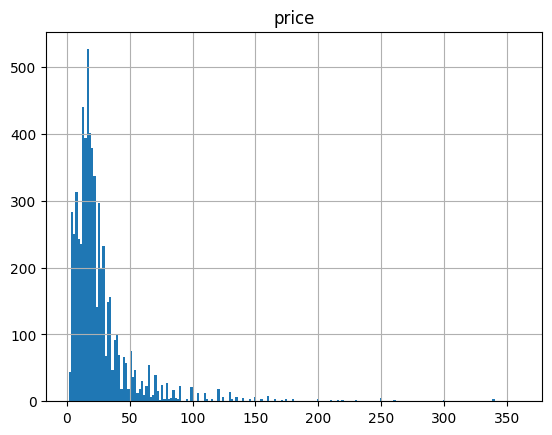

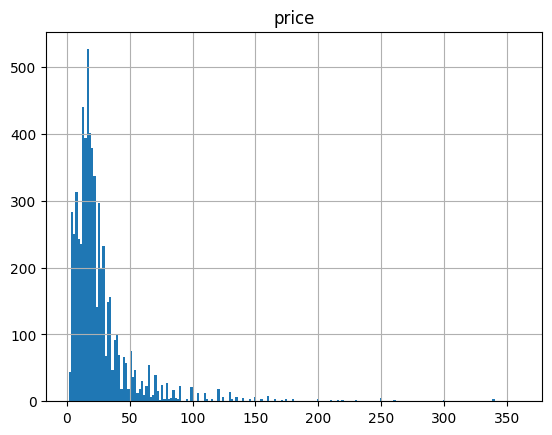

In [26]:
data_filtered.hist('price', bins=200)
data.hist('price', bins=200)


[[<Axes: title={'center': 'area'}>]]
[[<Axes: title={'center': 'area'}>]]


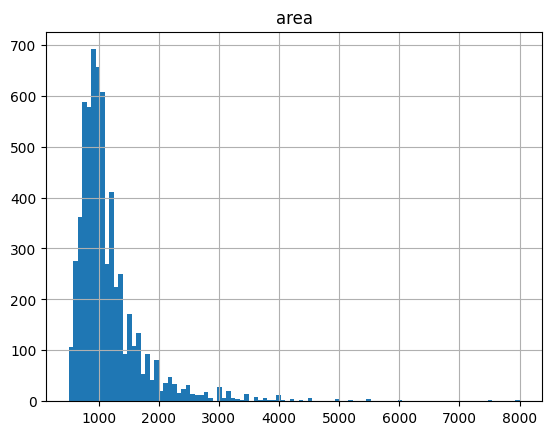

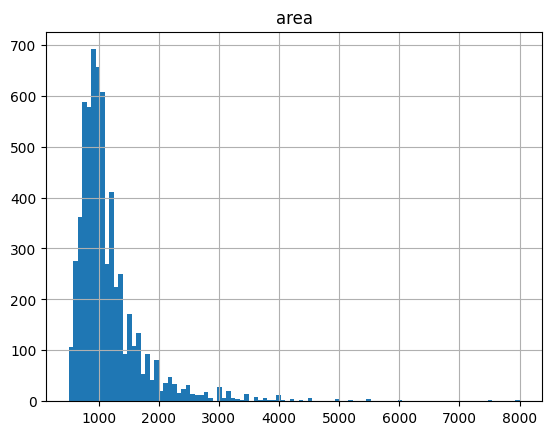

In [27]:
print(data.hist('area', bins=100))
print(data_filtered.hist('area', bins=100))

#### Вывод

- Метод межквартильтных размахов не изменил исходные данные. Это означает, что в исходном датафрейме нет существенных выбросов у признаков.

#### Заключение по анализу гистограмм

- Судя по гистограмме цен, большая часть стоимостей домов распределена в диапозоне от 1.5 до 50 млн рупий. Средняя стоимость составляет 26 млн. 

- Такие признаки, как количество спальнь, душевых, парковок и лифтов в большинстве достигают минимальных значений. Эти показатели отражают зависимость от стоимости дома 

- Большая часть площадей участков распределена в пределах от 500 до 2000 кв.м. Средняя площадь составляет более 630 кв.м.

### Ценовые факторы

В этом разделе будут проанализированы факторы, которе больше всего влияют на цену жилья в Мумбаи, на основе данных, исследуемых в прошлом разделе.

**1. Составим карту зависимости стоимости жилья от его района.**

In [28]:
def color_producer(price):
    if price <= data['price'].quantile(0.25):
        return '#1a9850' #тёмно-зелёный
    elif price <= data['price'].quantile(0.5):
        return '#91cf60'  #светло-зелёный
    elif price <= data['price'].quantile(0.75):
        return '#fee08b' #светло-жёлтый
    elif price >= 300.0:
        return '#00ffff'
    else:
        return '#d73027' #красный
    

In [29]:
mumbai_lat = data['latitude'].mean()
mumbai_lon = data['longitude'].mean()

m = folium.Map(location=[mumbai_lat, mumbai_lon], zoom_start=11)

for index, row in data.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3, 
        color=color_producer(row['price']),
        fill=True,
        fill_opacity=0.7,
        popup=f"Цена: {row['price']}"  
    ).add_to(m)
    

m

**Заключение**

- Видна зависимость цены жилья от района города Мумбаи
- Жильё к побережью и к центру города стоит дороже

**2. Составим диаграмму рассеяния стоимости жилья от площади участка**

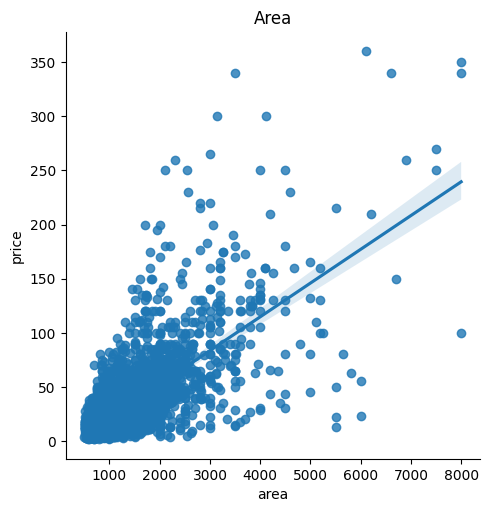

In [30]:
sns.lmplot(x='area', y='price', data=data)
plt.title('Area');

**Заключение**

- Наблюдается положительная корреляция: в целом, с увеличением площади, стоимость жилья тоже возрастает 

- Разброс данных достаточно велик, что указывает на то, что площадь не является единственным фактором, определяющим стоимость жилья.

**3. Составим диаграмму рассеяния стоимости жилься от количества душевых, лифтов и парковок**

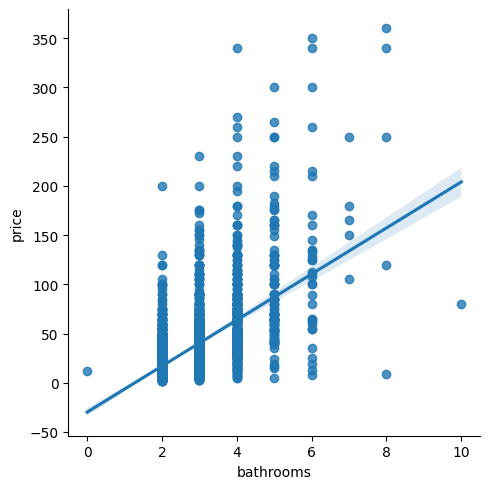

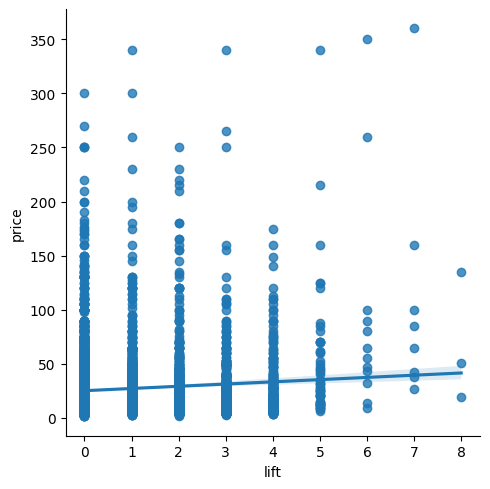

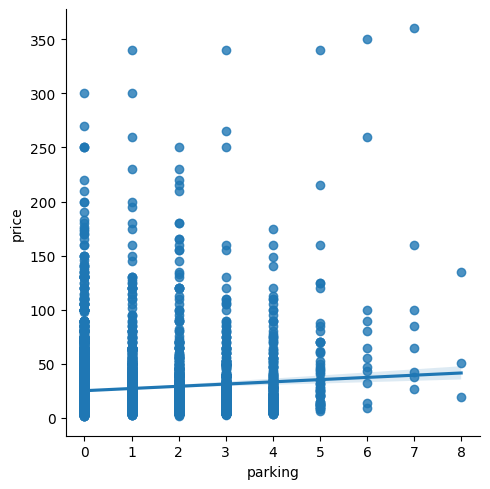

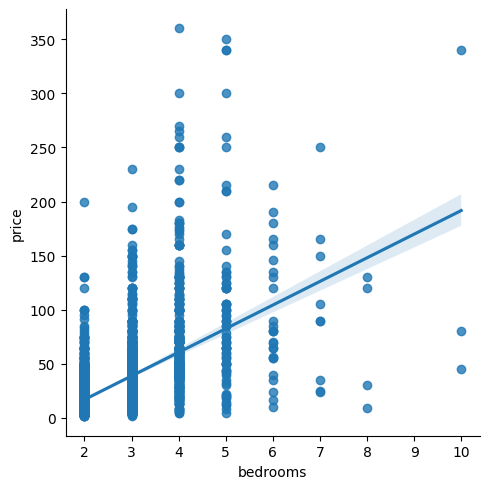

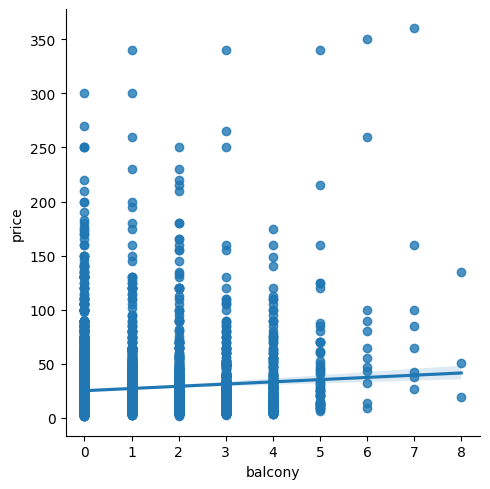

In [31]:
sns.lmplot(x='bathrooms', y='price', data=data)
sns.lmplot(x='lift', y='price', data=data)
sns.lmplot(x='parking', y='price', data=data)
sns.lmplot(x='bedrooms', y='price', data=data)
sns.lmplot(x='balcony', y='price', data=data)

**Заключение:**

- На всех диаграммах можно заметить положительную корреляцию, это значит, что все признаки влияют на формирование стоимости жилья.

- Высокая корреляция к цене наблюдается  у количества душевых и спальнь

**4. Для наглядности, составим тепловую карту корреляции признаков** 

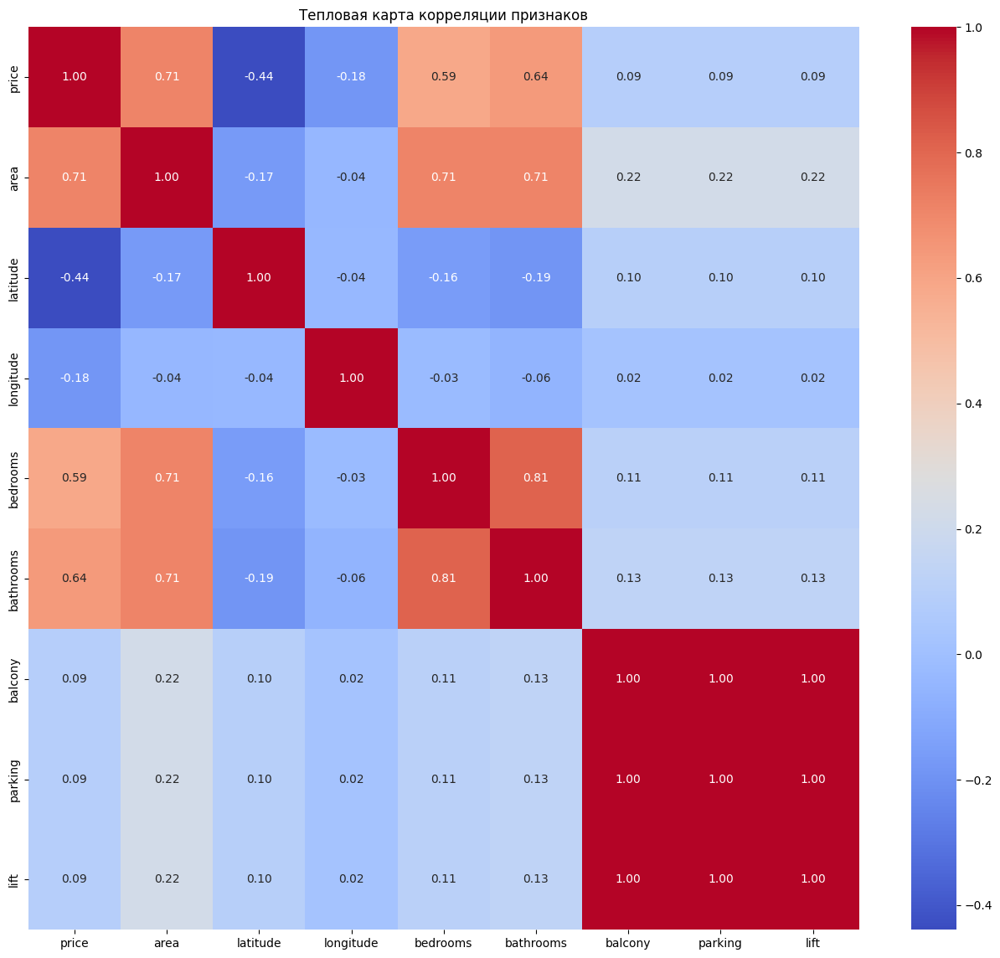

In [32]:
corr_matrix = data.corr(numeric_only=True) 


plt.figure(figsize=(16, 14))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Тепловая карта корреляции признаков')
plt.show()

**Заключение**

- Наблюдается зависимость между широтой расположения дома и его цены. Действительно, если посмотреть на карту, можно заметить, что с увеличением широты (т.е движение к северу) цены на жильё уменьшаются.

- Высокая корреляция между количествами лифтов, парковок и балконов, причём у всех трёх признаков корреляция с ценой довольно низкая. Данные признаки в основном являются характеристиками многоквартирных домов, которые строятся по некоторому стандарту с определённым количеством каждой категории. В современных реалях, наличие всех трёх факторов в многоквартирных домах не является премиальным признаком

- Большая корреляция между количествами ванных комнат и спален. Данная зависимость объясняется культурой, распространённой в Мумбаи: принято иметь отдельную ванную комнату для каждой спальни.

- Очевидна высокая корреляция между площадью жилья и количествами спален с ванными комнатами.

#### Зависимость цены от типа строения и статуса обустройства мебелью

**1. Зависимость цены от типа строения**



Рационально будет оценивать эту характеристику такого ценового сегмента, количество домов в котором наибольшее, то есть до 50 млн рупий.

<Figure size 1000x600 with 0 Axes>

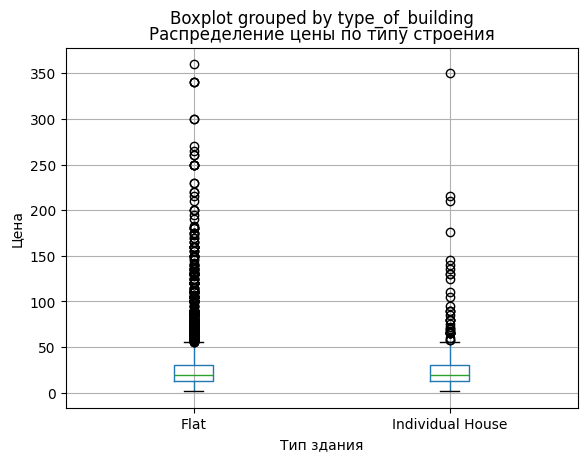

In [33]:
str_price = 'price'
low_price_data  =data[data[str_price]<=0.5e8]
plt.figure(figsize=(10, 6))
low_price_data.boxplot(by='type_of_building', column=str_price, grid=True)
plt.title('Распределение цены по типу строения')
plt.xlabel('Тип здания')
plt.ylabel('Цена')
plt.show()

**2. Зависимость цены от типа обустройства**

Сравнение в сегменте до 50 млн рупий

<Figure size 1000x600 with 0 Axes>

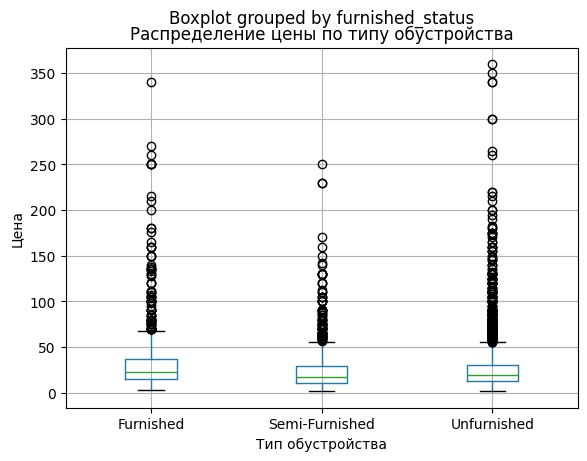

In [34]:
plt.figure(figsize=(10, 6))
low_price_data.boxplot(by='furnished_status', column=str_price, grid=True)
plt.title('Распределение цены по типу обустройства')
plt.xlabel('Тип обустройства')
plt.ylabel('Цена')
plt.show()

**3. Зависимость цены от нового или продаваемого жилья**

<Figure size 1000x600 with 0 Axes>

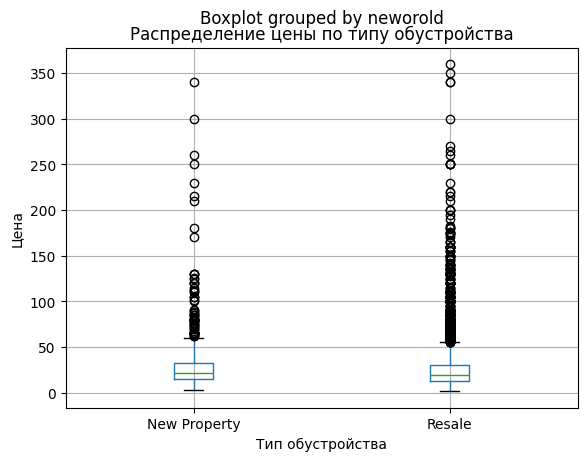

In [35]:
plt.figure(figsize=(10, 6))
low_price_data.boxplot(by='neworold', column=str_price, grid=True)
plt.title('Распределение цены по типу обустройства')
plt.xlabel('Тип обустройства')
plt.ylabel('Цена')
plt.show()

#### Заключение

- Средние цены за квартиру и дом почти не отличаются

- Очевидно, что жильё, которое хорошо обставлено мебелью, будет стоять дороже (22.3 млн), чем жильё, которое обставлено мало (18.4 млн) или вовсе необставлено (17.9 млн). 

- Новое жильё стоит дороже, чем повторно продаваемое, однако эта разница не велика.

### Label Encoding

- Применим данный метод для преобразования категориального признака ```status```. Будем считать, что жильё, которое готово к заселению помечается цифрой 1, а то, что нет - 0



In [36]:
status = 'status'
data[status]= data[status].map({'Ready to Move' : 1, 'Under Construction' : 0})
data[status] = data[status].astype('uint8')

- Также применим его для категориальных признаков ```neworold``` и ```type_of_building``` 

In [37]:
neworold = 'neworold'
data[neworold] = data[neworold].map({'New Property':1, 'Resale':0}).astype('uint8')

In [38]:
type_building = 'type_of_building'

data[type_building] = data[type_building].map({'Flat':1, 'Individual House':0}).astype('uint8')

- Изменим названия столбцов на более понятные: ```status``` - ```ready_to_move```, ```neworold``` - ```new_housing```, ```type_of_building``` - ```flat_or_individual```

In [39]:
status = 'ready_to_move'
neworold = 'new_housing'
type_building = 'flat_or_individual'

data = data.rename(columns={'status':status, 'neworold': neworold, 'type_of_building': type_building})

data[[status, neworold, type_building]].head(10)

,ready_to_move,new_housing,flat_or_individual
0,0,1,1
1,0,1,1
2,0,1,1
3,1,1,1
4,1,1,1
5,1,1,1
6,1,1,1
7,1,1,1
8,1,1,1
9,1,0,1


### One-hot кодирование

Над исследуемым набором данных будет выполнено one-hot кодирование, которое преобразует категориальные признаки в числовые. Идея процесса  заключается в создании нового бинарного столбца (признака) для каждой уникальной категории в исходном категориальном столбце.

In [40]:
categoric_col = data.select_dtypes(include='category').columns.to_list()

data_one_hot = pd.get_dummies(data, columns=categoric_col, drop_first=True)

data_one_hot

,price,area,latitude,longitude,bedrooms,bathrooms,balcony,ready_to_move,new_housing,parking,lift,flat_or_individual,furnished_status_Semi-Furnished,furnished_status_Unfurnished
0,22.400000,629,19.032800,72.896357,2,2,0,0,1,0,0,1,False,True
1,35.000000,974,19.032800,72.896357,3,2,0,0,1,0,0,1,False,True
2,31.700001,968,19.085600,72.909277,3,3,0,0,1,0,0,1,False,True
3,18.700001,629,19.155756,72.846862,2,2,2,1,1,2,2,1,False,True
4,13.500000,1090,19.177555,72.849887,2,2,0,1,1,0,0,1,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6232,19.500000,810,19.138320,72.810020,2,2,0,1,0,0,0,1,True,False
6233,22.000000,1400,19.221920,72.854250,3,3,1,1,0,1,1,1,False,True
6234,20.000000,750,19.144320,72.824111,2,2,0,1,0,0,0,1,False,True
6235,11.000000,700,19.047201,72.872225,2,2,0,1,0,0,0,1,False,False


In [48]:
data_one_hot['furnished_status_Semi-Furnished'] = data_one_hot['furnished_status_Semi-Furnished'].astype('uint8')
data_one_hot['furnished_status_Unfurnished'] = data_one_hot['furnished_status_Unfurnished'].astype('uint8')

### Сохранение предобработанного набора данных

In [49]:
data_one_hot.to_csv('result_mumbai.csv', index=False)

In [50]:
data_one_hot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6237 entries, 0 to 6236
Data columns (total 14 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   price                            6237 non-null   float32
 1   area                             6237 non-null   int16  
 2   latitude                         6237 non-null   float64
 3   longitude                        6237 non-null   float64
 4   bedrooms                         6237 non-null   uint8  
 5   bathrooms                        6237 non-null   uint8  
 6   balcony                          6237 non-null   uint8  
 7   ready_to_move                    6237 non-null   uint8  
 8   new_housing                      6237 non-null   uint8  
 9   parking                          6237 non-null   uint8  
 10  lift                             6237 non-null   uint8  
 11  flat_or_individual               6237 non-null   uint8  
 12  furnished_status_Sem

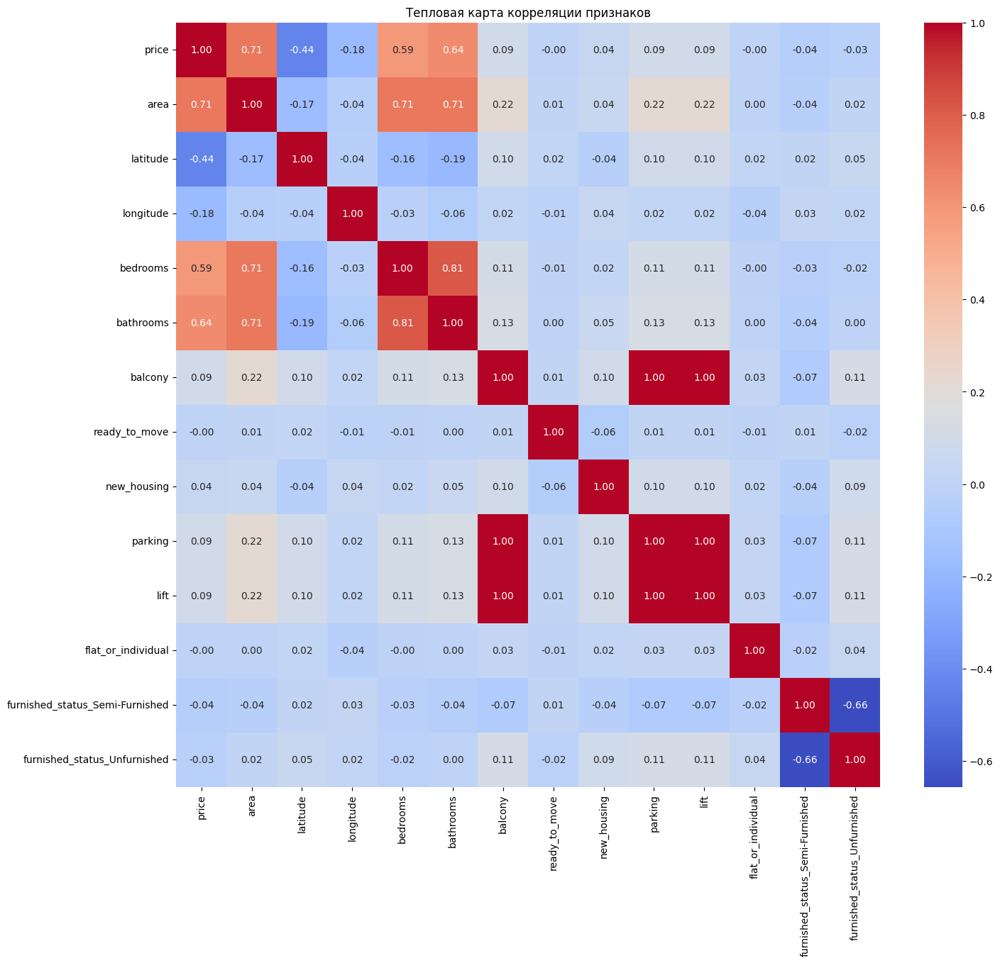

In [43]:
corr_matrix = data_one_hot.corr(numeric_only=True) 


plt.figure(figsize=(16, 14))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Тепловая карта корреляции признаков')
plt.show()